## Functional analysis

In this part of the assignment, I will analyze the differentially expressed genes found by DESeq2 on the dataset. Three replicates of non-stimulated GSC RNA-seq samples were compared with 3 replicates of  CIDD-0149897 stimulated samples. The DESeq2 analysis resulted in a deseq.results.tsv file. 

In [7]:
cd /home/luna.kuleuven.be/r0913112/data/jupyternotebooks/Regulatory-Genomics/Task-1/functional-analysis-gene-signatures
head deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
WASH7P	59.794964548904	0.407645562215211	0.278867583455035	1.46178898660317	0.143799043044183	0.241463421447989
RP11-34P13.18	152.786142390382	0.14395411773157	0.173191151663905	0.831186329951354	0.405868376065017	0.541076691217171
AP006222.2	10.7494880446476	0.220294176740581	0.6157547682142	0.35776284344411	0.720520799167363	0.81156286107912
MTND2P28	830.090925188535	0.897005391090248	0.0859712621453284	10.4337818092507	1.73829011132716e-25	4.34824048908992e-24
MTCO1P12	144.376666936119	0.838679266267884	0.200134159258021	4.19058530226528	2.78235785163129e-05	0.00012146662686176
MTCO2P12	43.1474430515919	0.848138740869159	0.32668319202833	2.59621174754411	0.00942579571146187	0.0237238864810385
MTATP6P1	1544.24638695799	0.873787924768068	0.0704580942642932	12.4015265228496	2.56392090655584e-35	9.45309132348396e-34
MTCO3P12	46.8237667893234	0.515591520679537	0.333023318252091	1.54821447154414	0.121570668328086	0.211366412841289
RP11-2

| Gene          | baseMean         | log2FoldChange    | lfcSE              | stat              | pvalue               | padj                 |
|---------------|------------------|-------------------|--------------------|-------------------|----------------------|----------------------|
| WASH7P        | 59.794964548904  | 0.407645562215211 | 0.278867583455035  | 1.46178898660317  | 0.143799043044183    | 0.241463421447989    |
| RP11-34P13.18 | 152.786142390382 | 0.14395411773157  | 0.173191151663905  | 0.831186329951354 | 0.405868376065017    | 0.541076691217171    |
| AP006222.2    | 10.7494880446476 | 0.220294176740581 | 0.6157547682142    | 0.35776284344411  | 0.720520799167363    | 0.81156286107912     |
| MTND2P28      | 830.090925188535 | 0.897005391090248 | 0.0859712621453284 | 10.4337818092507  | 1.73829011132716e-25 | 4.34824048908992e-24 |
| MTCO1P12      | 144.376666936119 | 0.838679266267884 | 0.200134159258021  | 4.19058530226528  | 2.78235785163129e-05 | 0.00012146662686176  |
| MTCO2P12      | 43.1474430515919 | 0.848138740869159 | 0.3266831920283    | 2.59621174754411  | 0.00942579571146187  | 0.0237238864810385   |
| MTATP6P1      | 1544.24638695799 | 0.873787924768068 | 0.0704580942642932 | 12.4015265228496  | 2.56392090655584e-35 | 9.45309132348396e-34 |
| MTCO3P12      | 46.8237667893234 | 0.515591520679537 | 0.333023318252091  | 1.54821447154414  | 0.121570668328086    | 0.211366412841289    |
| RP11-206L10.2 | 59.6544595512424 | 0.416746320251527 | 0.261470561562297  | 1.59385560562325  | 0.11096837972958     | 0.196155080687632    |

## Use arbitrary thresholds to create lists of up- and down-regulated genes

In [6]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv | head

RP4-740C4.5
TNFRSF9
SLC9A1
SESN2
RP11-334L9.1
MYCL
RP1-228H13.5
SLC6A9
PLK3
CCDC17


In [7]:
#We will create two text files, one with the upregulated genes and the other one with the down regulated genes
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv > up-logFC1-p05.txt
awk '$3 != "NA" && $3 < -1 && $7 < 0.05 {print $1}' deseq.results.tsv > down-logFC1-p05.txt
wc -l up-logFC1-p05.txt
wc -l down-logFC1-p05.txt

209 up-logFC1-p05.txt
319 down-logFC1-p05.txt


## Humanmine.org

Humanmine.org is an integrated database of human genomics and proteomics data that allows the exploration and analysis of experimental and computational data, as well as data retrieved from curated databases.
To use it, I will upload my up- and down-regulated genes (.txt files) into the website and analyze the output.

The first thing we see when the website loads is the number of identifiers that matched a gene. For my 209 identifiers, Humanmine was able to match 186 (2 of these being synonyms). The other 23 were not found. With the saved list, we can move on to looking at distribution and enrichment for upregulated genes.

Initially, we can see the observed vs expected distribution of genes in each chromosome match, but not exactly. Some counts are higher than expected and some lower, but in general they seem to resemble the expected more or less.
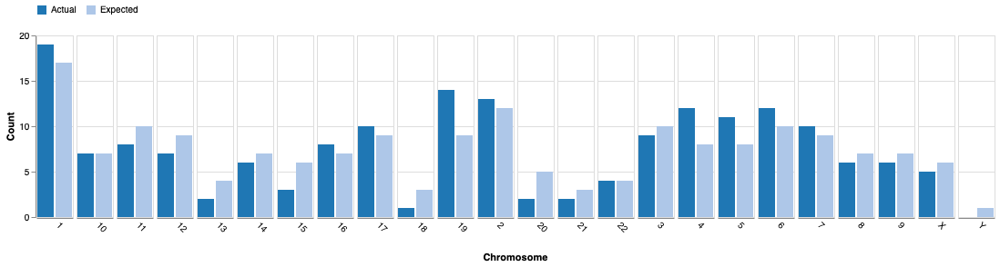

Moreover, if we look at the gene ontology enrichment and the pathway enrichment, we can see that most of the results (with significant p-values) correspond to responses to stress or other stimuli. This makes sense, since we are dealing with cancer cells that are actively growing tumors and will develop mechanisms to help the adapt to stressful conditions like hypoxia, nutrient deprivation, exposure to DNA damage and immune responses. 

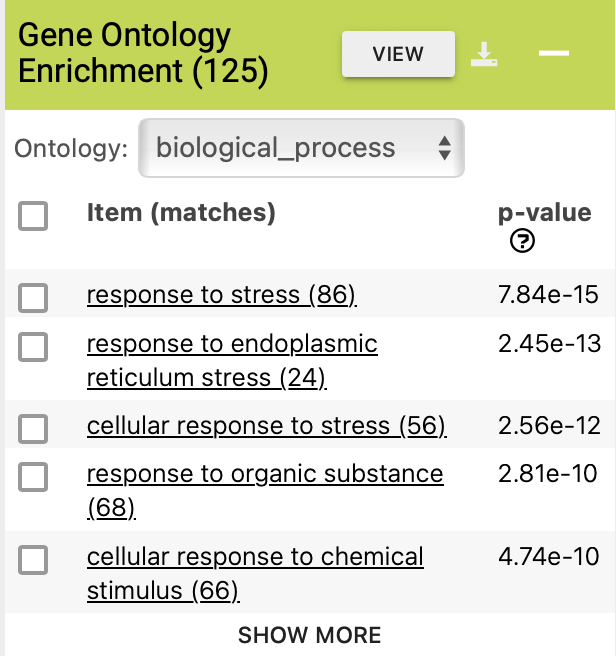
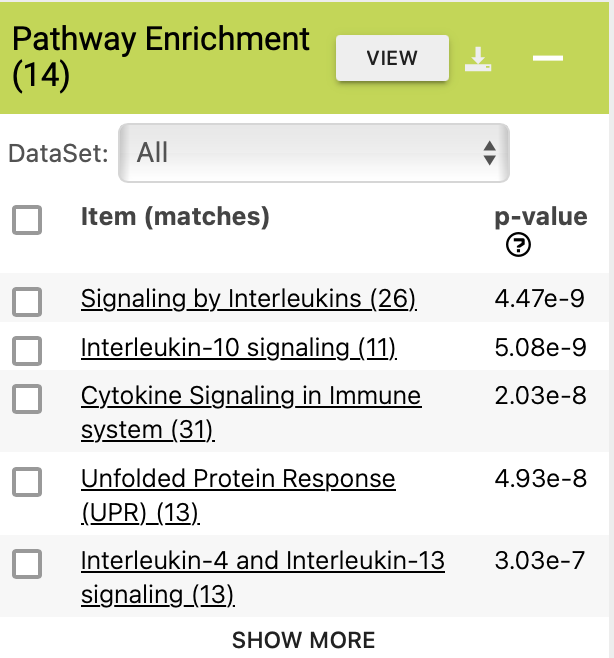

Moreover, Humanmine gives an interesting visualization on how expression changes depending on the human tissue. Some genes stand out more than other in all 97 evaluated tissues. Since we are dealing with brain cancer cells (glioblastoma), I was expecting to see a high degree of expression in nervous tissues. However, these genes are expressed more in all tissues when compared to other genes in the dataset. 
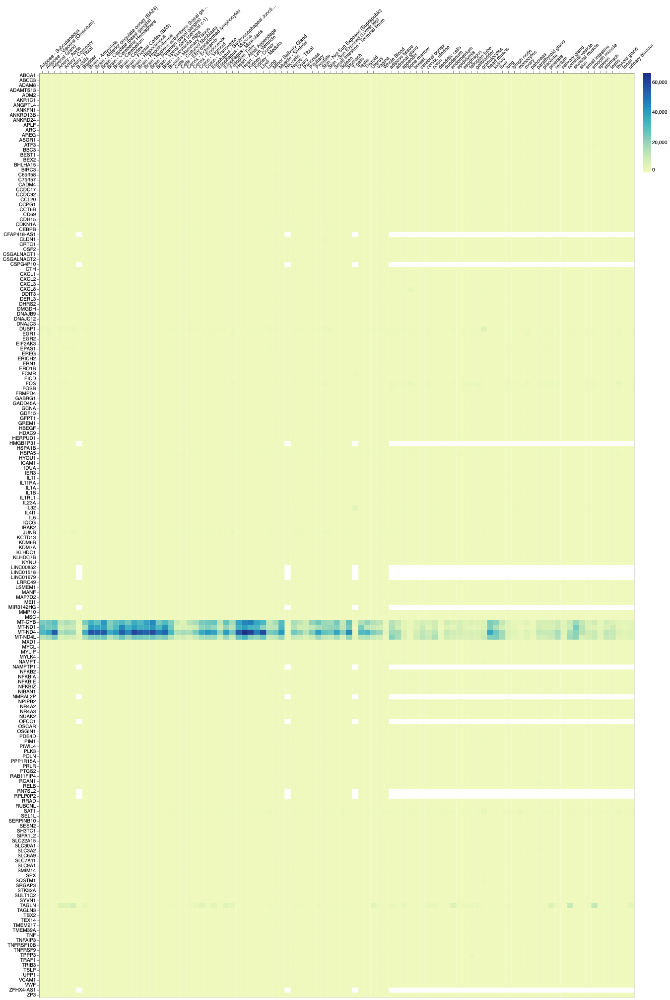
Although the image is quite large, it's perfectly clear that a cluster of genes (4 to be exact) are overexpressed in comparisson with the rest. These genes are MT-CYB, MT-ND1, MT-ND4, and MT-ND4L. 

Now, I will look at the downregulated genes. For the 319 identifiers, there were 227 matches to a gene, 14 synonymous genes, and 78 were not found. For the observed vs expected distribution of genes in each chromosome, we can see less of a match than with the upregulated genes. Some counts are higher than expected and some lower, and the only chromosomes that match are chromosomes 8, 10 and 13. 
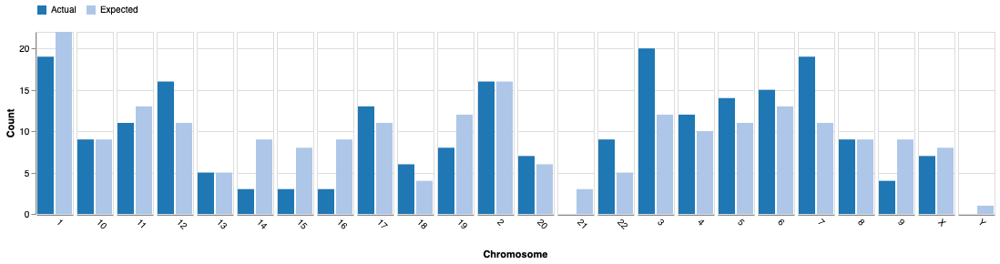

For the gene ontology and pathway enrichment, we can see that most of the results (with significant p-values) correspond to cell surface receptor signalling, tissue development, and cellular responses to exogenous substances (organic or chemical substances), as well as interferon gamma (IFN-γ) signalling. This also makes sense, since we are dealing with cancerous cells that would be expected to respond badly to stimuli and would be expected to not express IFN-γ correctly. This interferon is a cytokine that has important anti-tumor effects and is able to suppress tumor growth.
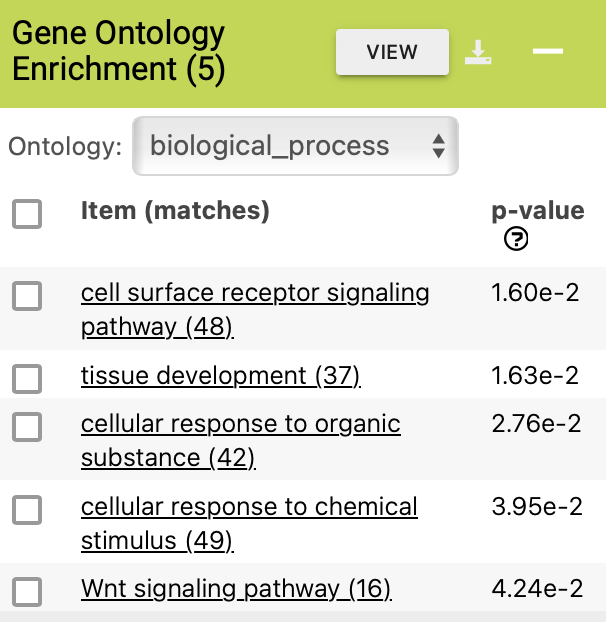
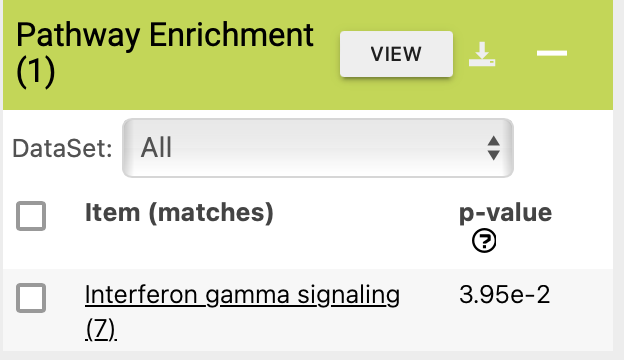


## GProfiler
GProfiler is a web server for characterising and manipulating gene lists. Just like with Humanmine, the lists of up- and down-regulated genes are uploaded to the graphical interface. For the upregulated genes, GProfiler gives us an overview of the main results. This shows a plot of GO terms against the adjusted p-value (-log10) for each term. We can see that most significant terms are shown in the dark circles, whereas the rest of terms are transparent. Whereas the Humanmine results predicted that the up-regulated genes were mostly related to responses to stress, in this case they are more related to receptor binding. The only matching Gene Ontology term is the response to chemical stimuli.   

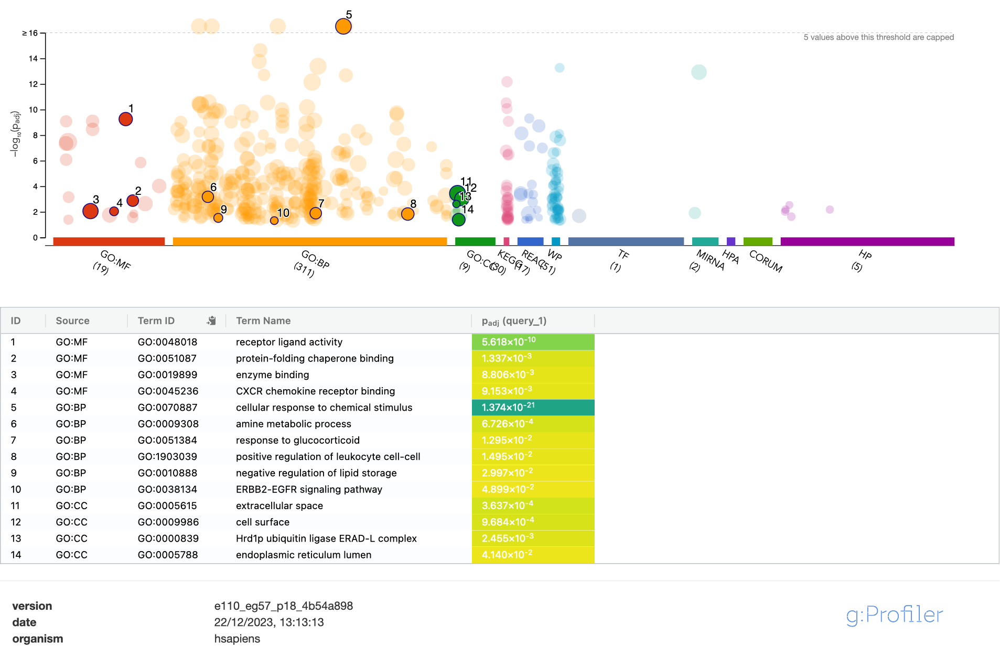

For the down-regulated genes, we can see much less terms in the plot. Additionally, we can see the same that we saw for the up-regulated genes: many of the results do not match the results from the Humanmine analysis. This might be due to the fact that these databases are trained on different datasets, and that they use different methods for functional prediction. 

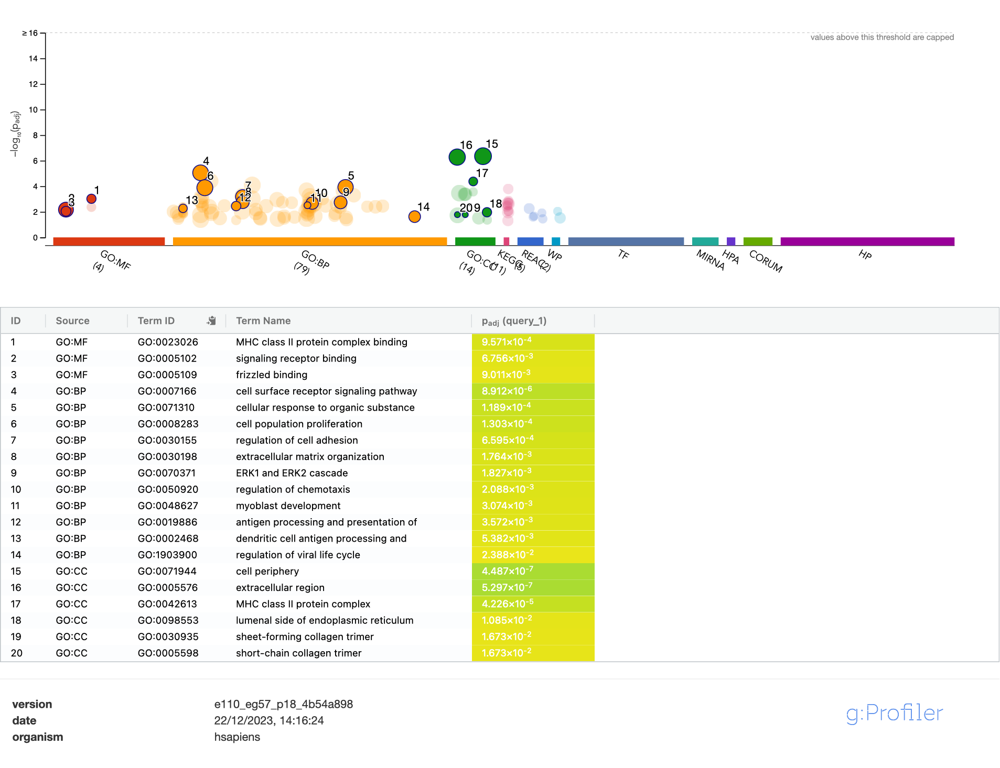

## GORilla
GORilla is a tool for identifying and visualizing enriched GO terms in ranked lists of genes. To perform this analysis, we will first sort all of our genes based on their logFC.  

In [4]:
cd /home/luna.kuleuven.be/r0913112/data/jupyternotebooks/Regulatory-Genomics/Task-1/functional-analysis-gene-signatures

cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCdesc.txt

head deseq.results.sortFCdesc.txt

TNF
CCL20
TRAF1
IL6
RUBCNL
CXCL2
RP11-372K14.2
BIRC3
IL1A
TEX14


GORilla recognized 13287 out of 15559 gene terms entered, and they were recognized by gene symbol (not other gene IDS). 7 duplicate genes were removed (keeping the highest ranking instance of each gene), leaving a total of 13280 genes, and only 12056 of these genes are associated with a GO term. In the figure shown below, the most significant terms are in red, and the least in white. For all of the genes and GO terms, an enrichment score is given. This score is calculated as:

N = total number of genes

B = total number of genes associated with a specific GO term

n = number of genes in the top of the input list or in the target set when appropriate

b = number of genes in the intersection

Enrichment = (b/n) / (B/N)



For the most significant term (response to external stimulus) (FDR q-value = 2.68E-12), the enrichment score is 2.65, which comes from the fact that there are 96 genes known to be involved in this function within the top 489 genes (96/486, observed frequency). The expected frequency is 892/12056. The FDR q-value is a significance measure, since it is the correction of the  p-value for multiple testing using the Benjamini and Hochberg correction.

To study a ranked list in ascending order (most down-regulated gene on top):

In [6]:
cat deseq.results.tsv | sort -k3,3g | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCasc.txt

head deseq.results.sortFCasc.txt 

TPRG1-AS1
MIR210HG
MARC1
GALNTL6
CCDC70
SCN1B
CCR7
PROM2
FGF1
TRAC


For the down-regulated genes, the most significant term (tissue development), is much less significant than the top up-regulated term (2.8E-8 and 2.68E-12, respectively). However, both have the same enrichment score (2.65). This term is related to 66 genes from the top 846 genes. 

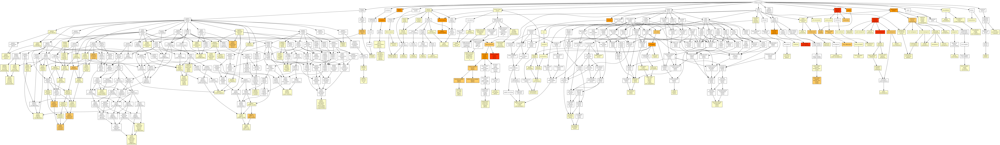

## GSEA : Gene Set Enrichment Analysis

GSEA is used for enrichment analysis, and in this case it is used to analyze the genes regulated by the treatment (treated vs control cells). 

In [8]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | head

TNF 4.85035036378635
CCL20 3.0561362480522
TRAF1 2.90156033937702
IL6 2.71333183542541
RUBCNL 2.67160212978723
CXCL2 2.66450431944092
RP11-372K14.2 2.65445058698114
BIRC3 2.63117501595459
IL1A 2.62154745064419
TEX14 2.60245981647579
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [9]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | tr ' ' '\t' > deseq.logFC.rnk

In [10]:
head deseq.logFC.rnk

TNF	4.85035036378635
CCL20	3.0561362480522
TRAF1	2.90156033937702
IL6	2.71333183542541
RUBCNL	2.67160212978723
CXCL2	2.66450431944092
RP11-372K14.2	2.65445058698114
BIRC3	2.63117501595459
IL1A	2.62154745064419
TEX14	2.60245981647579


The results for the enrichment analysis are the following:

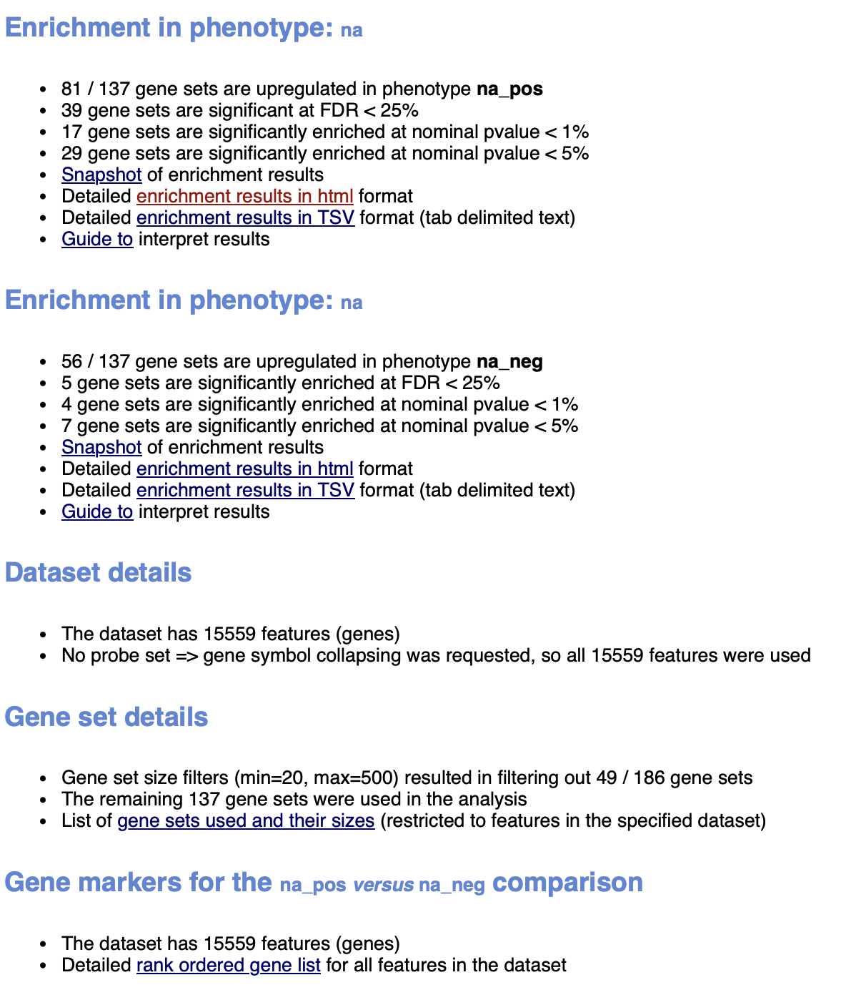

In the results, the bottom part (na_neg) shows pathways related to DNA replication (leading edge 4149) and with multiple developmental signalling pathways (Hedgehog, WNT, and calcium). However, not much can be concluded from this. 

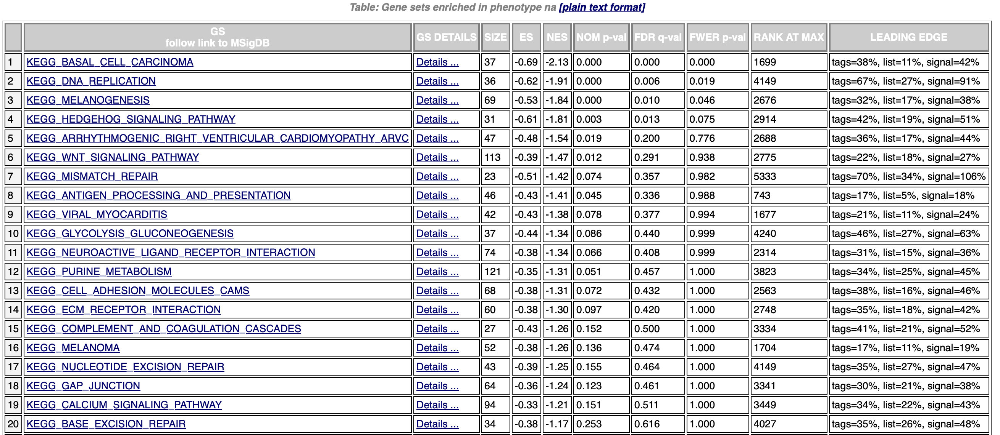

In the top part (na_pos), however, more interesting results come to light. We can see pathways related to p53 and apoptosis, which are known to be regulated by ERβ. 

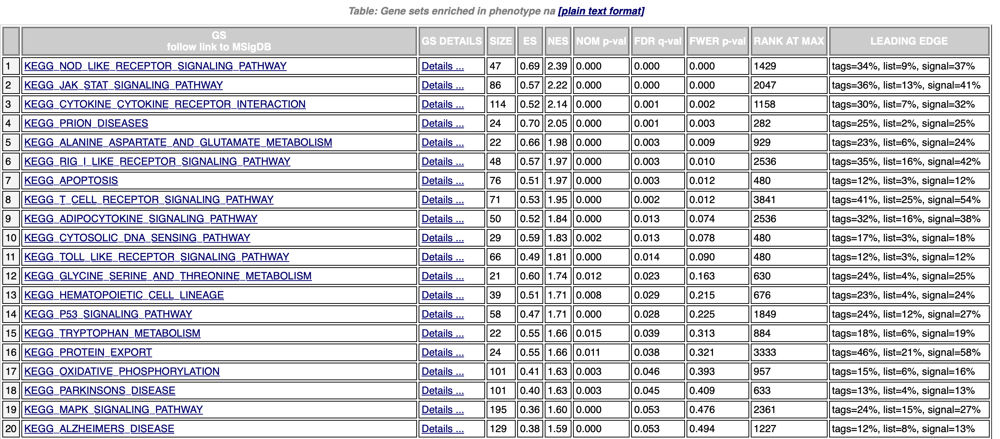

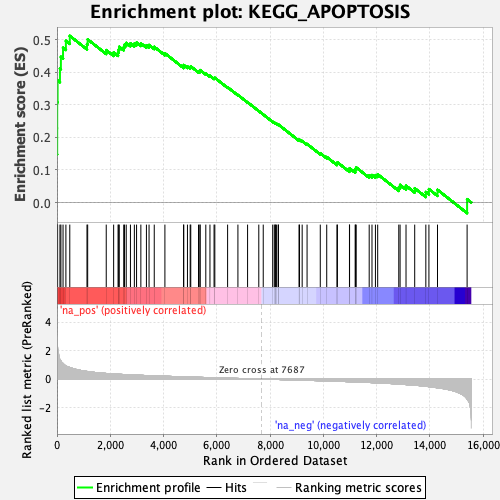

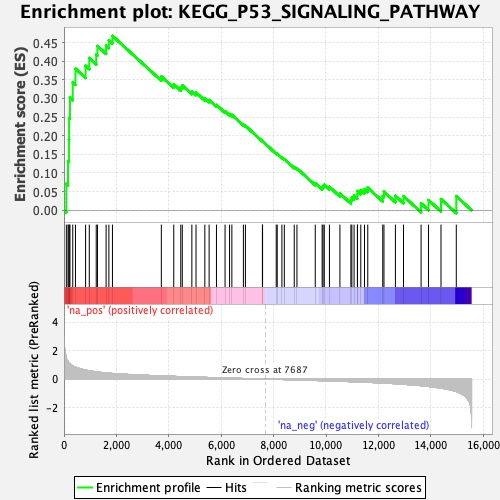

## Cytoscape & iRegulon
With this, we can identify enriched motifs and predict any transcription factors. After loading the up-regulated genes into Cytoscape and running iRegulon, I found that the most enriched motif ID is "homer-M00001", which is associated with 27 targets, among which are CEBPB, HSPA5, IL23A, ATF3, HERPUD1, DDIT3, and TRIB3. These genes all have different clinical significance. Of importance to my analysis, we can see the transcription factor CEBPB, which is widely expressed in several different cancers. This TF can bind to certain DNA regulatory regions and is important in regulating genes involved in immune and inflammatory responses by binding to interleukins. This is all confirmation of the previous results, which show enrichments of interleukin and UPR pathways. 

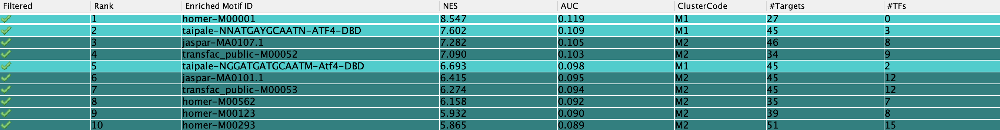

The second most enriched motif ID is "taipale-NNATGAYGCAATN-ATF4-DBD", with 45 targets and 3 transcription factors associated (AFT3, ATF4, and CEBPB). CEBPB, like mentioned before, is a TF associated with cancer. ATF3 and ATF4 are Activating Transcription Factors 3 and 4, and are master regulators also associated with cancer. The predicted target genes, for example, for ATF4, are shown below:

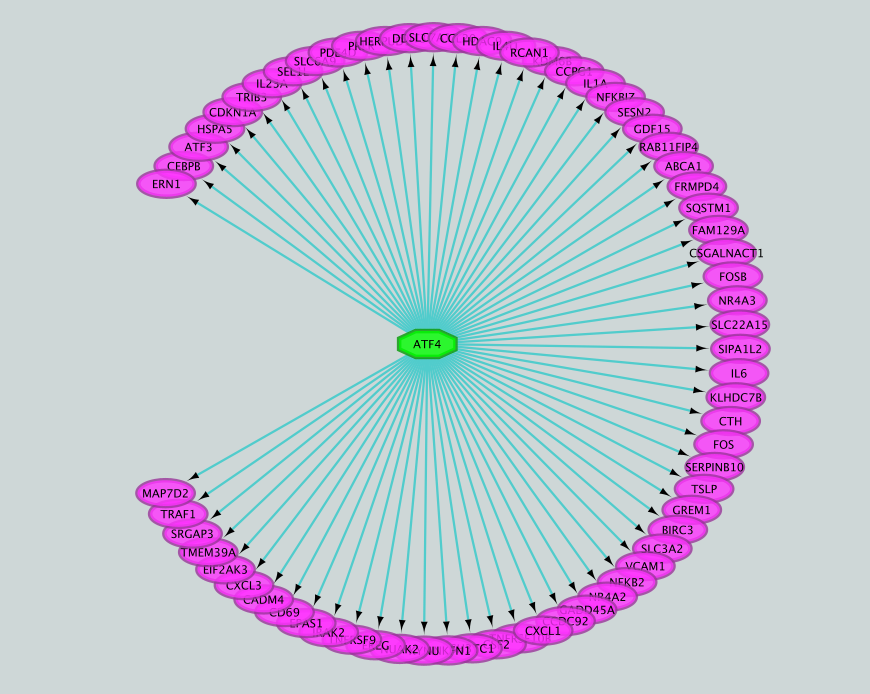